# Topping the Charts on Spotify
## Identifying Features that Make Songs a Hit

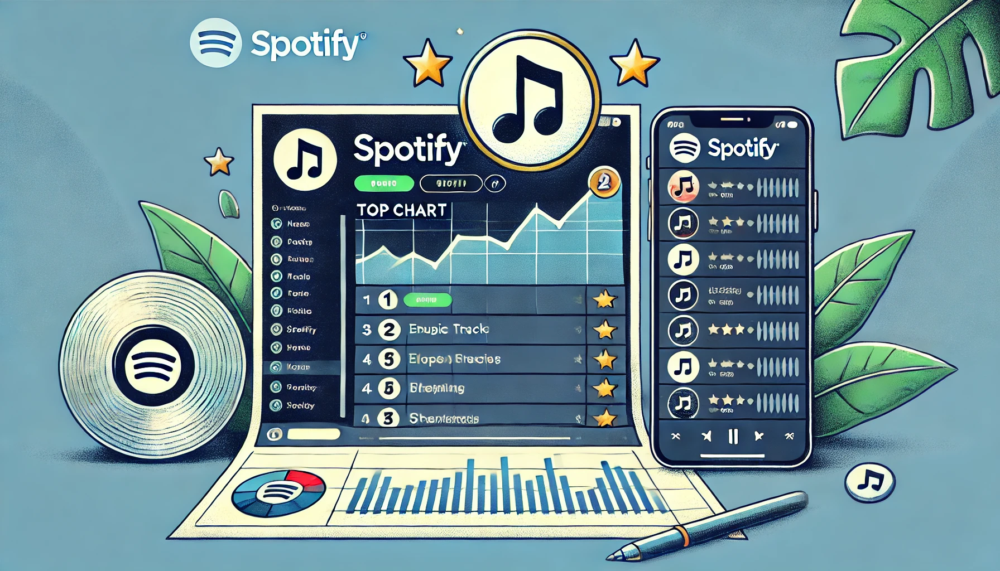

##### In this analysis, we will compare the features of the top 100 most streamed tracks with other tracks. By examining key audio features, we aim to uncover patterns and characteristics that are common among popular songs. We will leverage two essential statistical tools for making predictions:

- **Probability Mass Function (PMF)**
- **Cumulative Distribution Function (CDF)**

## Understanding PMF and CDF
### 1. Probability Mass Function (PMF)
P(X=x)

The PMF gives the probability that a discrete random variable is exactly equal to some value. It provides insights into how probabilities are distributed across different values of a variable. By examining the PMF of various audio features, we can understand which specific values or ranges are more prevalent among top streamed tracks.

### 2. Cumulative Distribution Function (CDF)
F(x)=P(X≤x)

The CDF gives the probability that a random variable is less than or equal to a certain value. It is a cumulative measure that helps in understanding the distribution of values up to a certain point. By examining the CDF, we can determine the cumulative likelihood of a feature being below a certain threshold, offering a broader view of the data distribution.

## Objective
The goal of this analysis is to identify and compare the distributions of key audio features for the top 100 most streamed tracks versus other tracks. By understanding these distributions, we can uncover the characteristics that contribute to a song's popularity on Spotify.

## Features to be Analyzed
We will analyze the following audio features:

1. Liveness (%): Detects the presence of a live audience in the recording. Higher values indicate a higher probability of the track being live.
2. Acousticness (%): Measures whether the track is acoustic.
3. Energy (%): Represents a perceptual measure of intensity and activity.
4. Danceability (%): Describes how suitable a track is for dancing based on tempo, rhythm stability, beat strength, and overall regularity.
5. Key: Indicates the key in which the track is composed.
6. BPM (Beats Per Minute): Measures the tempo of the track.
7. Speechiness (%): Detects the presence of spoken words in a track.

## Methodology
- Data Collection: Gather data on the top 100 most streamed tracks and other tracks.
- Calculate PMF: For each feature, calculate the PMF to understand the probability distribution of values.
- Calculate CDF: For each feature, calculate the CDF to understand the cumulative distribution of values.
- Visualization using Plotly Library: Visualize the PMF and CDF for each feature to compare the distributions between top streamed tracks and others.

### Example of CDF Visualization using Plotly
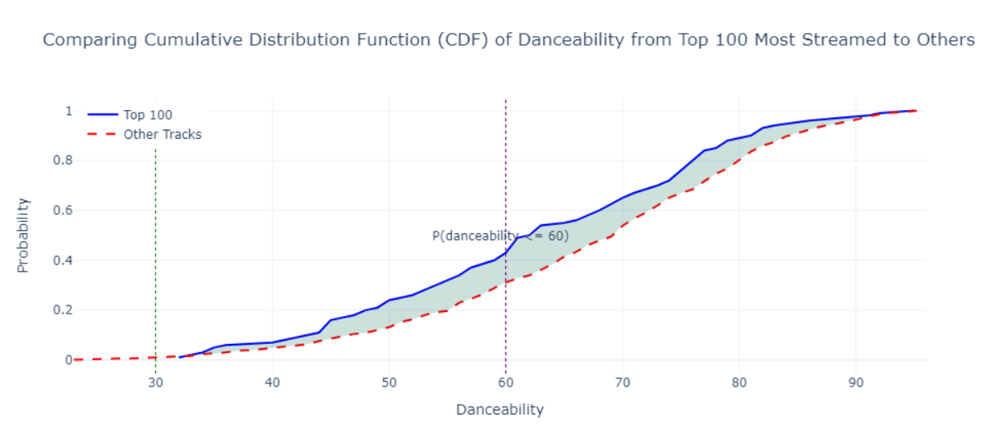


# Key Findings

Across all features, certain ranges and peaks in these audio features are more prevalent in the top 100 most streamed tracks compared to others. Features like lower liveness, lower acousticness, higher danceability, and specific BPM ranges appear to correlate with higher streaming numbers, suggesting these attributes might contribute to a track's popularity. Here are additional insights from each feature analysis:

## 1. Liveness:


- Tracks with lower liveness_% values (indicating less live performance elements) dominate the top 100 most streamed tracks.
- Lower liveness could imply a preference for studio-quality productions over live recordings, which tend to be more polished and controlled.

## 2. Acousticness:


- Lower acousticness_% values are more common among top 100 tracks.
- Tracks with less acoustic sound are more popular, possibly indicating a preference for electronic or digitally produced music over acoustic or unplugged versions.

## 3. Energy:


- Higher energy_% values, especially around 50-70%, are prevalent in top tracks.
- High-energy tracks are likely more engaging and can evoke stronger emotional responses, making them more suitable for settings like workouts, parties, and other activities that require upbeat music.

## 4. Danceability:


- Higher danceability_% values are significantly represented in top tracks.
- Tracks that are easy to dance to are preferred, possibly because they are more enjoyable in social settings and can promote a positive, energetic atmosphere.

## 5. Key:


- Certain musical keys, such as C# and G, have higher probabilities among top tracks.
- These keys might be perceived as more pleasant or commercially viable. The choice of key can influence the mood and appeal of a track, making it more memorable and engaging for listeners.

## 6. BPM (Beats Per Minute) / Tempo:


- Specific BPM ranges, particularly around 100-140 BPM, are more prevalent in top tracks.
- This BPM range aligns with typical tempos found in popular genres like pop, dance, and electronic music. These tempos are often associated with rhythmic and catchy beats that can enhance the listener's experience.

## 7. Speechiness:


- Lower speechiness_% values are more common among top tracks.
- Tracks with less spoken word content are preferred, which may suggest that listeners favor more melodic and lyrical content over spoken word, such as rap or spoken poetry.

## Additional Insights:
- While specific ranges in features like danceability and energy are prevalent, the variety in peaks across different features indicates that there isn't a one-size-fits-all formula for a hit track. Different tracks appeal to different listener preferences.
- The observed trends might reflect the dominant genres within the top 100 most streamed tracks. For instance, pop and dance music, known for higher danceability and energy, might heavily influence these patterns.
- Production Quality: Lower liveness and acousticness suggest a preference for highly produced, studio-quality tracks. This could reflect listener preferences for the clarity and precision that studio recordings offer.

## Practical Application:
- Producers and artists can use these insights to tailor their music to fit the popular ranges of these features, potentially increasing their chances of creating a hit.
- Playlist Curation Streaming platforms can use this data to enhance their recommendation algorithms, ensuring that playlists contain tracks with attributes that align with user preferences.
- Marketing Strategies Understanding these trends can help in targeting marketing efforts towards tracks with features that are more likely to become popular, optimizing promotion strategies.

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go

from scipy.stats import chi2_contingency
from scipy.stats import spearmanr
from scipy.stats import pearsonr


In [2]:
df = pd.read_csv('spotify-2023.csv', encoding='ISO-8859-1')
df.head()

,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,...,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,Seven (feat. Latto) (Explicit Ver.),"Latto, Jung Kook",2,2023,7,14,553,147,141381703,43,...,125,B,Major,80,89,83,31,0,8,4
1,LALA,Myke Towers,1,2023,3,23,1474,48,133716286,48,...,92,C#,Major,71,61,74,7,0,10,4
2,vampire,Olivia Rodrigo,1,2023,6,30,1397,113,140003974,94,...,138,F,Major,51,32,53,17,0,31,6
3,Cruel Summer,Taylor Swift,1,2019,8,23,7858,100,800840817,116,...,170,A,Major,55,58,72,11,0,11,15
4,WHERE SHE GOES,Bad Bunny,1,2023,5,18,3133,50,303236322,84,...,144,A,Minor,65,23,80,14,63,11,6


In [3]:
df.shape

(953, 24)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 953 entries, 0 to 952
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   track_name            953 non-null    object
 1   artist(s)_name        953 non-null    object
 2   artist_count          953 non-null    int64 
 3   released_year         953 non-null    int64 
 4   released_month        953 non-null    int64 
 5   released_day          953 non-null    int64 
 6   in_spotify_playlists  953 non-null    int64 
 7   in_spotify_charts     953 non-null    int64 
 8   streams               953 non-null    object
 9   in_apple_playlists    953 non-null    int64 
 10  in_apple_charts       953 non-null    int64 
 11  in_deezer_playlists   953 non-null    object
 12  in_deezer_charts      953 non-null    int64 
 13  in_shazam_charts      903 non-null    object
 14  bpm                   953 non-null    int64 
 15  key                   858 non-null    ob

### 1. You see, the streams column contain the number of streams, hence the dtype's supposed to be int or float. But, from the above info, it turns out that the dtype is object. Therefore, we need to convert it.

In [5]:
# df['streams'] = pd.to_numeric(df['streams']) --> 
# ValueError: Unable to parse string "BPM110KeyAModeMajorDanceability53Valence75Energy69Acousticness7Instrumentalness0Liveness17Speechiness3"

When I try to convert data type of streams column with pd.to_numeric function, I got the above error. As it turns out, the error is in index 574 (see below). I could just drop that row, but if I do, I am gonna loose the other info, hence I'll just coerce the error.

In [6]:
df.loc[df['streams']=='BPM110KeyAModeMajorDanceability53Valence75Energy69Acousticness7Instrumentalness0Liveness17Speechiness3']

,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,...,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
574,Love Grows (Where My Rosemary Goes),Edison Lighthouse,1,1970,1,1,2877,0,BPM110KeyAModeMajorDanceability53Valence75Ener...,16,...,110,A,Major,53,75,69,7,0,17,3


In [7]:
df['streams'] = pd.to_numeric(df['streams'], errors='coerce')

In [8]:
df = df.dropna(subset=['streams'])

In [9]:
df['streams'].dtype

dtype('float64')

### 2. The columns 'released_year',	'released_month', and 'released_day' is unnecesseralily separated. We could just combine them into one column named = 'released date'

In [10]:
df['released_date'] = pd.to_datetime(df['released_day'].astype(str) + '-' +
                                     df['released_month'].astype(str) + '-' +
                                     df['released_year'].astype(str), dayfirst=True)
df.drop(columns=['released_day', 'released_month', 'released_year'], inplace= True)

### 3. I just want to focus on Spotify so I need to drop unnecessary columns for my convenience
columns to drop = 'in_apple_playlists','in_apple_charts','in_deezer_playlists','in_deezer_charts','in_shazam_charts'

In [11]:
df = df.drop(columns=['in_apple_playlists','in_apple_charts','in_deezer_playlists','in_deezer_charts','in_shazam_charts'])

### 4. Treating Missing Values by Filling it with the Mode

In [12]:
df.isnull().sum()

track_name               0
artist(s)_name           0
artist_count             0
in_spotify_playlists     0
in_spotify_charts        0
streams                  0
bpm                      0
key                     95
mode                     0
danceability_%           0
valence_%                0
energy_%                 0
acousticness_%           0
instrumentalness_%       0
liveness_%               0
speechiness_%            0
released_date            0
dtype: int64

In [13]:
#df = df['key'].fillna(df['key'].mode()[0], inplace=True) --- error future warning

# Calculate the mode of the 'key' column
mode_value = df['key'].mode()[0]

# Fill missing values with the mode value
df['key'] = df['key'].fillna(mode_value)

In [14]:
df.isnull().sum()

track_name              0
artist(s)_name          0
artist_count            0
in_spotify_playlists    0
in_spotify_charts       0
streams                 0
bpm                     0
key                     0
mode                    0
danceability_%          0
valence_%               0
energy_%                0
acousticness_%          0
instrumentalness_%      0
liveness_%              0
speechiness_%           0
released_date           0
dtype: int64

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 952 entries, 0 to 952
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   track_name            952 non-null    object        
 1   artist(s)_name        952 non-null    object        
 2   artist_count          952 non-null    int64         
 3   in_spotify_playlists  952 non-null    int64         
 4   in_spotify_charts     952 non-null    int64         
 5   streams               952 non-null    float64       
 6   bpm                   952 non-null    int64         
 7   key                   952 non-null    object        
 8   mode                  952 non-null    object        
 9   danceability_%        952 non-null    int64         
 10  valence_%             952 non-null    int64         
 11  energy_%              952 non-null    int64         
 12  acousticness_%        952 non-null    int64         
 13  instrumentalness_%    952

#### Below is the new shape 
(from 953 rows and 24 columns to be 952 rows and 17 columns)

In [16]:
df.shape

(952, 17)

In [17]:
df.duplicated().sum()

0

In [18]:
df.head()

,track_name,artist(s)_name,artist_count,in_spotify_playlists,in_spotify_charts,streams,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%,released_date
0,Seven (feat. Latto) (Explicit Ver.),"Latto, Jung Kook",2,553,147,141381703.0,125,B,Major,80,89,83,31,0,8,4,2023-07-14
1,LALA,Myke Towers,1,1474,48,133716286.0,92,C#,Major,71,61,74,7,0,10,4,2023-03-23
2,vampire,Olivia Rodrigo,1,1397,113,140003974.0,138,F,Major,51,32,53,17,0,31,6,2023-06-30
3,Cruel Summer,Taylor Swift,1,7858,100,800840817.0,170,A,Major,55,58,72,11,0,11,15,2019-08-23
4,WHERE SHE GOES,Bad Bunny,1,3133,50,303236322.0,144,A,Minor,65,23,80,14,63,11,6,2023-05-18


# Comparing Audio Features of the Top 100 Most Streamed Tracks with the Others

We will leverage the PMF and CDF to compare their features

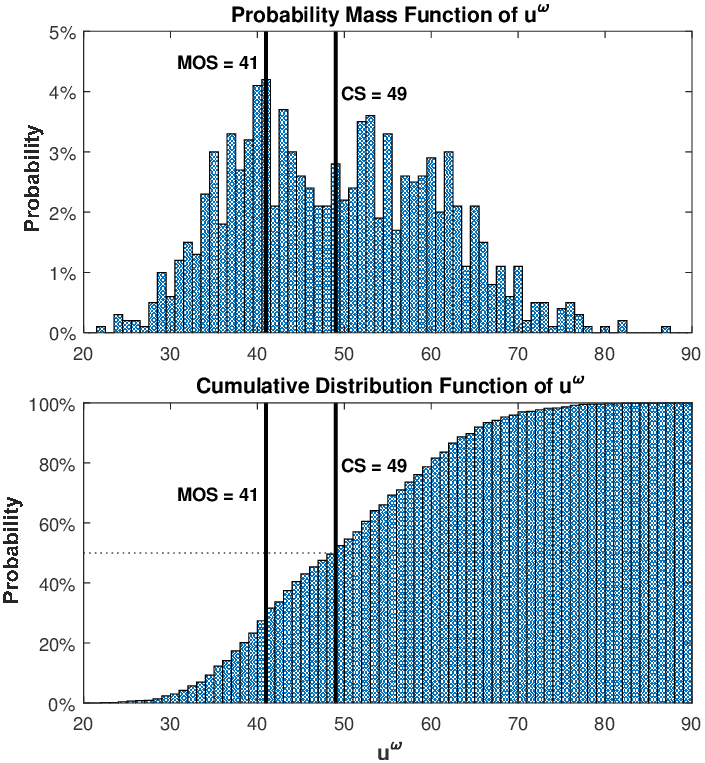

### Audio Features:

1. bpm: Beats per minute, a measure of song tempo
2. key: Key of the song
3. mode: Mode of the song (major or minor)
4. danceability_%: Percentage indicating how suitable the song is for dancing
5. valence_%: Positivity of the song's musical content
6. energy_%: Perceived energy level of the song
7. acousticness_%: Amount of acoustic sound in the song
8. instrumentalness_%: Amount of instrumental content in the song
9. liveness_%: Presence of live performance elements
10. speechiness_%: Amount of spoken words in the song

### Let's Explore the Danceability for Example

In [19]:
df['danceability_%'].unique()

array([80, 71, 51, 55, 65, 92, 67, 85, 81, 57, 78, 52, 64, 44, 86, 63, 69,
       48, 79, 74, 56, 72, 61, 75, 60, 76, 77, 59, 68, 53, 45, 50, 84, 70,
       88, 90, 43, 62, 49, 58, 34, 91, 82, 83, 54, 87, 35, 42, 93, 47, 73,
       66, 33, 37, 89, 95, 94, 32, 40, 36, 25, 41, 46, 39, 24, 23, 27, 28,
       31, 29, 96, 38], dtype=int64)

### Divide the data into "Top 100 most streamed tracks" and "other tracks"

In [20]:
top_100_most_streamed = df.sort_values(by='streams', ascending=False).head(100).reset_index(drop=True)

In [21]:
top_100_most_streamed.head()

,track_name,artist(s)_name,artist_count,in_spotify_playlists,in_spotify_charts,streams,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%,released_date
0,Blinding Lights,The Weeknd,1,43899,69,3.703895e+09,171,C#,Major,50,38,80,0,0,9,7,2019-11-29
1,Shape of You,Ed Sheeran,1,32181,10,3.562544e+09,96,C#,Minor,83,93,65,58,0,9,8,2017-01-06
2,Someone You Loved,Lewis Capaldi,1,17836,53,2.887242e+09,110,C#,Major,50,45,41,75,0,11,3,2018-11-08
3,Dance Monkey,Tones and I,1,24529,0,2.864792e+09,98,F#,Minor,82,54,59,69,0,18,10,2019-05-10
4,Sunflower - Spider-Man: Into the Spider-Verse,"Post Malone, Swae Lee",2,24094,78,2.808097e+09,90,D,Major,76,91,50,54,0,7,5,2018-10-09


In [22]:
other_tracks = df.sort_values(by='streams', ascending= False).tail(len(df)-100).reset_index(drop=True)
other_tracks.head()

,track_name,artist(s)_name,artist_count,in_spotify_playlists,in_spotify_charts,streams,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%,released_date
0,Creep,Radiohead,1,36724,7,1.271293e+09,92,G,Major,53,12,34,1,0,12,4,1992-09-21
1,Why'd You Only Call Me When You're High?,Arctic Monkeys,1,23389,29,1.267333e+09,92,D,Major,70,81,63,4,0,8,4,2013-01-01
2,Titi Me Preguntï¿,Bad Bunny,1,9037,42,1.264311e+09,107,F,Minor,65,19,72,10,0,13,25,2022-05-06
3,Yonaguni,Bad Bunny,1,9644,28,1.260594e+09,180,C#,Major,64,44,65,28,0,14,12,2021-06-04
4,deja vu,Olivia Rodrigo,1,7545,4,1.256881e+09,181,A,Major,44,22,60,61,0,42,9,2021-04-01


**Note:** The value_counts(normalize=True) method is used to **calculate the probability of each value in a dataset**. When the normalize parameter is set to **True**, it will display the proportion of each value in the dataset rather than the actual frequency. This aligns with the concept of a **Probability Mass Function (PMF)**, where the PMF provides the probability that a discrete random variable will take on a specific value.

By using sort_index(), we ensure that the values are sorted according to their index, thus obtaining a PMF that is properly ordered from the smallest to the largest values. This allows us to easily visualize and analyze the probability distribution in a graph.

In [23]:
top_100_most_streamed['danceability_%'].value_counts(normalize=True).sort_index()

danceability_%
32    0.01
33    0.01
34    0.01
35    0.02
36    0.01
40    0.01
41    0.01
42    0.01
43    0.01
44    0.01
45    0.05
47    0.02
48    0.02
49    0.01
50    0.03
52    0.02
53    0.02
55    0.04
56    0.02
57    0.03
59    0.03
60    0.03
61    0.06
62    0.01
63    0.04
65    0.01
66    0.01
68    0.04
70    0.05
71    0.02
73    0.03
74    0.02
75    0.04
76    0.04
77    0.04
78    0.01
79    0.03
80    0.01
81    0.01
82    0.03
83    0.01
86    0.02
91    0.02
92    0.01
95    0.01
Name: proportion, dtype: float64

## 1. Prepare PMF and CDF Data to Plot (for this example, I am going to analyze the Danceability first)

In [24]:
top_100_danceability = top_100_most_streamed['danceability_%']
other_tracks_danceability = other_tracks['danceability_%']

pmf_top_100_danceability = top_100_danceability.value_counts(normalize=True).sort_index()
pmf_other_tracks_danceability = other_tracks_danceability.value_counts(normalize=True).sort_index()

cdf_top_100_danceability = pmf_top_100_danceability.cumsum()
cdf_other_tracks_danceability = pmf_other_tracks_danceability.cumsum()

## 2. Plot the PMF and CDF so we can see how the danceability affect the probability of a track reaching top 100

In [25]:
fig_pmf = go.Figure()
fig_pmf.add_trace(go.Bar(x=pmf_top_100_danceability.index, y=pmf_top_100_danceability.values, name='Top 100'))
fig_pmf.add_trace(go.Bar(x=pmf_other_tracks_danceability.index, y=pmf_other_tracks_danceability.values, name='Other Tracks'))
fig_pmf.update_layout(title='Comparing Probability Mass Function (PMF) of Danceability from Top 100 Most Streamed to Others',
                      xaxis_title = 'Danceability',
                      yaxis_title = 'Probability',
                      template='plotly_white')

In [26]:
fig_cdf = go.Figure()
fig_cdf.add_trace(go.Scatter(x=cdf_top_100_danceability.index, y=cdf_top_100_danceability.values, name='Top 100',
                             line=dict(color='blue', width=2), hoverinfo='x+y', hoverlabel=dict(bgcolor="blue")))
fig_cdf.add_trace(go.Scatter(x=cdf_other_tracks_danceability.index, y=cdf_other_tracks_danceability.values, name='Other Tracks',
                             line=dict(color='magenta', width=2, dash='dash'), hoverinfo='x+y', hoverlabel=dict(bgcolor="magenta")))

# Shaded area between curves
fig_cdf.add_trace(go.Scatter(x=cdf_top_100_danceability.index.tolist() + cdf_other_tracks_danceability.index.tolist()[::-1],
        y=cdf_top_100_danceability.values.tolist() + cdf_other_tracks_danceability.values.tolist()[::-1],
        fill='toself',
        fillcolor='rgba(0,100,80,0.2)',
        line=dict(color='rgba(255,255,255,0)'),
        hoverinfo='skip',
        showlegend=False
    ))
fig_cdf.update_layout(title='Comparing Cumulative Distribution Function (CDF) of Danceability from Top 100 Most Streamed to Others',
                      xaxis_title = 'Danceability',
                      yaxis_title = 'Probability', legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
        hovermode="x unified",
        annotations=[
            dict(x=0.5, y=0.5, xref="paper", yref="paper", text="P(danceability <= 60)", showarrow=False)
        ],
        shapes=[
            dict(
                type="line",
                x0=30, x1=30, y0=0, y1=1,
                line=dict(dash="dot", color="green", width=1),
                xref='x', yref='paper'
            ),
            dict(
                type="line",
                x0=60, x1=60, y0=0, y1=1,
                line=dict(dash="dot", color="purple", width=1),
                xref='x', yref='paper'
            )
        ],
        template='seaborn'
    )

### From the above plot, We can see a **very clear** difference (shaded area between curves) between:
1. Danceability of Top 100 Tracks (Blue); and
2. Danceability of Other Tracks (Purple)

In [27]:
max_prob_top_100 = pmf_top_100_danceability[pmf_top_100_danceability == pmf_top_100_danceability.max()]
max_prob_other_tracks = pmf_other_tracks_danceability[pmf_other_tracks_danceability == pmf_other_tracks_danceability.max()]

print("Danceability value(s) with the highest probability for Top 100 Most Streamed Tracks:")
print(max_prob_top_100)

print("\nDanceability value(s) with the highest probability for Other Tracks:")
print(max_prob_other_tracks)

Danceability value(s) with the highest probability for Top 100 Most Streamed Tracks:
danceability_%
61    0.06
Name: proportion, dtype: float64

Danceability value(s) with the highest probability for Other Tracks:
danceability_%
70    0.044601
Name: proportion, dtype: float64


In [28]:
# Define bins for danceability
bins = np.linspace(df['danceability_%'].min(), df['danceability_%'].max(), 5)  # Adjust the number of bins as needed

# Calculate PMF for bins
top_100_most_streamed['danceability_bin'] = pd.cut(top_100_most_streamed['danceability_%'], bins=bins, include_lowest=True)
other_tracks['danceability_bin'] = pd.cut(other_tracks['danceability_%'], bins=bins, include_lowest=True)


pmf_top_100_bins = top_100_most_streamed['danceability_bin'].value_counts(normalize=True).sort_index()
pmf_other_tracks_bins = other_tracks['danceability_bin'].value_counts(normalize=True).sort_index()

# Find the bin with the highest probability
max_prob_bin_top_100 = pmf_top_100_bins.idxmax()
max_prob_bin_other_tracks = pmf_other_tracks_bins.idxmax()

print("Danceability bin with the highest probability for Top 100 Most Streamed Tracks:")
print(max_prob_bin_top_100)

print("\nDanceability bin with the highest probability for Other Tracks:")
print(max_prob_bin_other_tracks)

Danceability bin with the highest probability for Top 100 Most Streamed Tracks:
(59.5, 77.75]

Danceability bin with the highest probability for Other Tracks:
(59.5, 77.75]


Since, danceability_% is the Percentage indicating how suitable the song is for dancing, then Top 100 Most Streamed Tracks are more suitable for Dancing compared to other tracks. And the more danceable a track is, the **more likely** it is to top the chart.

## (Optional) 3. See the Correlation of Danceability and Number of Streams

I also want to see the correlation of danceability and number of streams using **PearsonR Correlation**

In [29]:
pearsonr_coefficient, p_value = pearsonr(df['danceability_%'], df['streams'])


print('p-Value:%0.3f'%(p_value))
print ('PearsonR Correlation Coefficient %0.3f'%(pearsonr_coefficient))

if p_value < 0.05:
    print("There is a significant correlation between danceability and number of streams.")
else:
    print("There is no significant correlation between danceability and number of streams.")

p-Value:0.001
PearsonR Correlation Coefficient -0.105
There is a significant correlation between danceability and number of streams.


In [30]:
audio_features = df.iloc[:,5:16]
audio_features

,streams,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,141381703.0,125,B,Major,80,89,83,31,0,8,4
1,133716286.0,92,C#,Major,71,61,74,7,0,10,4
2,140003974.0,138,F,Major,51,32,53,17,0,31,6
3,800840817.0,170,A,Major,55,58,72,11,0,11,15
4,303236322.0,144,A,Minor,65,23,80,14,63,11,6
...,...,...,...,...,...,...,...,...,...,...,...
948,91473363.0,144,A,Major,60,24,39,57,0,8,3
949,121871870.0,166,F#,Major,42,7,24,83,1,12,6
950,73513683.0,92,C#,Major,80,81,67,4,0,8,6
951,133895612.0,97,C#,Major,82,67,77,8,0,12,5


In [31]:
audio_features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 952 entries, 0 to 952
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   streams             952 non-null    float64
 1   bpm                 952 non-null    int64  
 2   key                 952 non-null    object 
 3   mode                952 non-null    object 
 4   danceability_%      952 non-null    int64  
 5   valence_%           952 non-null    int64  
 6   energy_%            952 non-null    int64  
 7   acousticness_%      952 non-null    int64  
 8   instrumentalness_%  952 non-null    int64  
 9   liveness_%          952 non-null    int64  
 10  speechiness_%       952 non-null    int64  
dtypes: float64(1), int64(8), object(2)
memory usage: 89.2+ KB


In [32]:
audio_features.iloc[:,-7:]

,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,80,89,83,31,0,8,4
1,71,61,74,7,0,10,4
2,51,32,53,17,0,31,6
3,55,58,72,11,0,11,15
4,65,23,80,14,63,11,6
...,...,...,...,...,...,...,...
948,60,24,39,57,0,8,3
949,42,7,24,83,1,12,6
950,80,81,67,4,0,8,6
951,82,67,77,8,0,12,5


In [33]:
for column in audio_features.iloc[:,-7:]:
    pearsonr_coefficient, p_value = pearsonr(df[column], df['streams'])
    print(f"PearsonR Coefficient: {pearsonr_coefficient}")
    print(f"p-Value: {p_value}")
    if p_value < 0.05:
        print(f"There is a significant correlation between, '{column}' , and track ranking.")
    else:
        print(f"There is no significant correlation between, '{column}' , and track ranking.")

PearsonR Coefficient: -0.10545688369141906
p-Value: 0.001119497946396513
There is a significant correlation between, 'danceability_%' , and track ranking.
PearsonR Coefficient: -0.04083136749515948
p-Value: 0.20813833078844157
There is no significant correlation between, 'valence_%' , and track ranking.
PearsonR Coefficient: -0.02605148836424892
p-Value: 0.42204075273802527
There is no significant correlation between, 'energy_%' , and track ranking.
PearsonR Coefficient: -0.0044846527006840615
p-Value: 0.8900897808687568
There is no significant correlation between, 'acousticness_%' , and track ranking.
PearsonR Coefficient: -0.04490247317510965
p-Value: 0.1662601060739281
There is no significant correlation between, 'instrumentalness_%' , and track ranking.
PearsonR Coefficient: -0.04833729577983246
p-Value: 0.13613625046421166
There is no significant correlation between, 'liveness_%' , and track ranking.
PearsonR Coefficient: -0.1123329964033855
p-Value: 0.0005157879912254401
There is

***Important Note***

When Pearson correlation shows that there is no linear correlation between two variables, it does not mean that there is no relationship between them at all. It is possible that the relationship between the variables may be non-linear, but Pearson correlation cannot capture it.

In [34]:
correlation_matrix = audio_features.iloc[:,-7:].corr()

<Axes: >

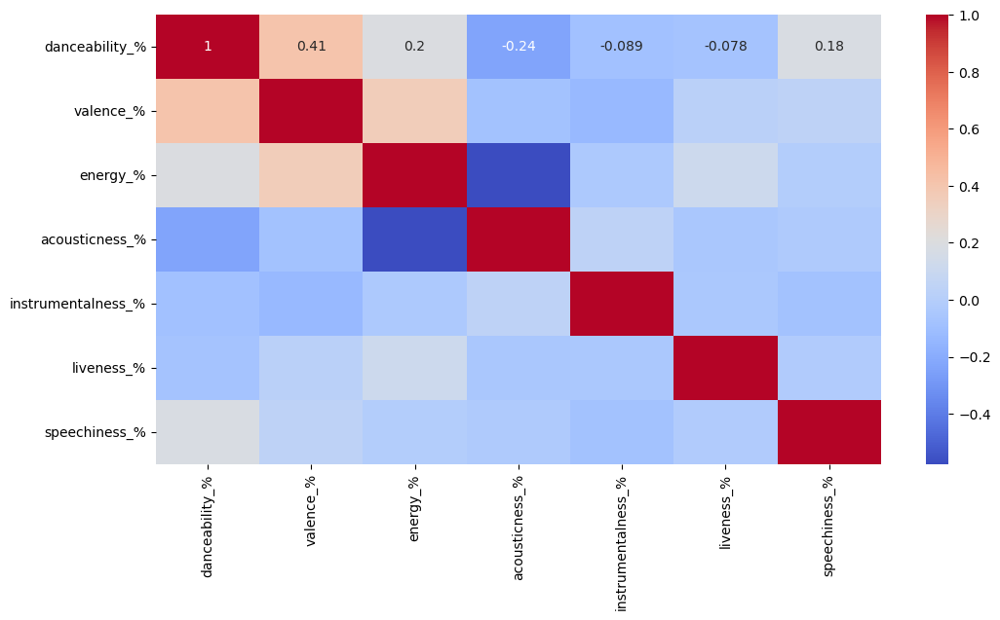

In [35]:
plt.figure(figsize=(12, 6))
sns.heatmap(correlation_matrix, annot= True, cmap='coolwarm')

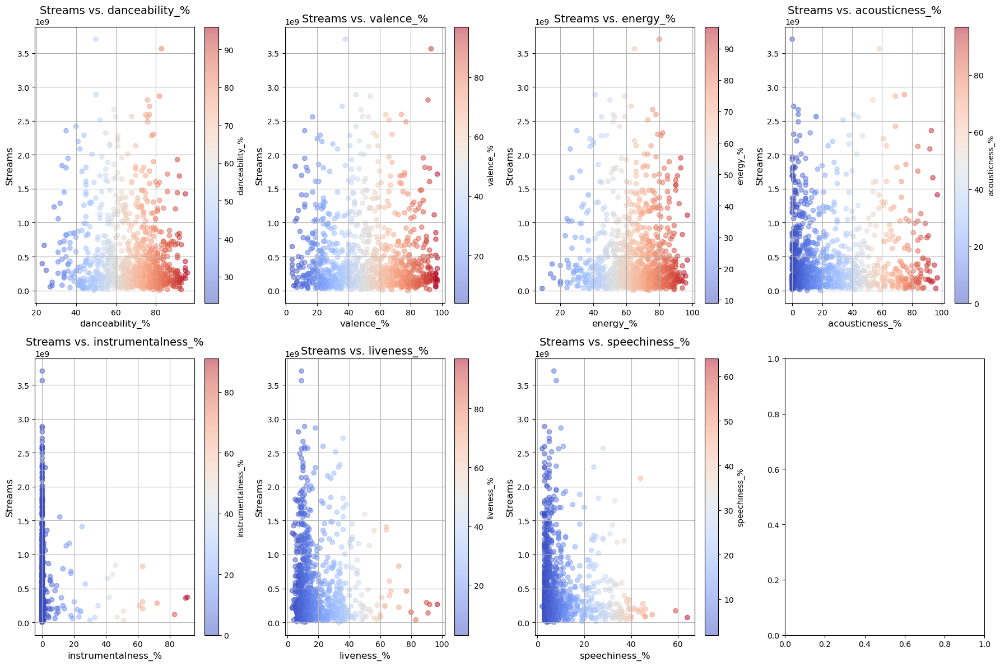

In [36]:
fig, axes = plt.subplots(2, 4, figsize=(18, 12))
axes = axes.flatten()

for i, column in enumerate(audio_features.iloc[:,-7:]):
    plt.sca(axes[i])
    
    scatter = plt.scatter(df[column], df['streams'], c=df[column], cmap='coolwarm', alpha=0.5)
    
    plt.xlabel(column, fontsize=12)
    plt.ylabel('Streams', fontsize=12)
    plt.title(f'Streams vs. {column}', fontsize=14)
    plt.grid(True)
    plt.colorbar(scatter, label=column)


plt.tight_layout()
plt.show()

## Lastly, we can custom a function to plot the pmf and cdf for the rest of audio features

In [37]:
audio_features.head()

,streams,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,141381703.0,125,B,Major,80,89,83,31,0,8,4
1,133716286.0,92,C#,Major,71,61,74,7,0,10,4
2,140003974.0,138,F,Major,51,32,53,17,0,31,6
3,800840817.0,170,A,Major,55,58,72,11,0,11,15
4,303236322.0,144,A,Minor,65,23,80,14,63,11,6


In [38]:
audio_features.iloc[:,1:11]

,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,125,B,Major,80,89,83,31,0,8,4
1,92,C#,Major,71,61,74,7,0,10,4
2,138,F,Major,51,32,53,17,0,31,6
3,170,A,Major,55,58,72,11,0,11,15
4,144,A,Minor,65,23,80,14,63,11,6
...,...,...,...,...,...,...,...,...,...,...
948,144,A,Major,60,24,39,57,0,8,3
949,166,F#,Major,42,7,24,83,1,12,6
950,92,C#,Major,80,81,67,4,0,8,6
951,97,C#,Major,82,67,77,8,0,12,5


In [39]:
features = audio_features.iloc[:,1:11]

# Define the function to plot PMF and CDF
def plot_pmf_cdf(column):
    top_100 = top_100_most_streamed[column]
    other_tracks_column = other_tracks[column]

    pmf_top_100 = top_100.value_counts(normalize=True).sort_index()
    pmf_other_tracks = other_tracks_column.value_counts(normalize=True).sort_index()

    cdf_top_100 = pmf_top_100.cumsum()
    cdf_other_tracks = pmf_other_tracks.cumsum()

    fig_pmf = go.Figure()
    fig_pmf.add_trace(go.Bar(x=pmf_top_100.index, y=pmf_top_100.values, name='Top 100'))
    fig_pmf.add_trace(go.Bar(x=pmf_other_tracks.index, y=pmf_other_tracks.values, name='Other Tracks'))
    fig_pmf.update_layout(
        title=f"Comparing Probability Mass Function (PMF) of '{column}' from Top 100 Most Streamed to Others",
        xaxis_title=column,
        yaxis_title='Probability')

    fig_cdf = go.Figure()
    fig_cdf.add_trace(go.Scatter(x=cdf_top_100.index, y=cdf_top_100.values, mode='lines', name='Top 100',
                                 line=dict(color='blue', width=2), hoverinfo='x+y', hoverlabel=dict(bgcolor="blue")))
    fig_cdf.add_trace(go.Scatter(x=cdf_other_tracks.index, y=cdf_other_tracks.values, mode='lines', name='Other Tracks',
                                 line=dict(color='red', width=2, dash='dash'), hoverinfo='x+y', hoverlabel=dict(bgcolor="red")))
    # Shaded area between curves
    fig_cdf.add_trace(go.Scatter(
        x=cdf_top_100.index.tolist() + cdf_other_tracks.index.tolist()[::-1],
        y=cdf_top_100.values.tolist() + cdf_other_tracks.values.tolist()[::-1],
        fill='toself',
        fillcolor='rgba(0,100,80,0.2)',
        line=dict(color='rgba(255,255,255,0)'),
        hoverinfo='skip',
        showlegend=False
    ))
    
    fig_cdf.update_layout(
        title=f"Comparing Cumulative Distribution Function (CDF) of '{column}' from Top 100 Most Streamed to Others",
        xaxis_title=column,
        yaxis_title='Cumulative Probability',
        legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
        hovermode="x unified"
    )

    return fig_pmf, fig_cdf

# Iterate over the audio features and generate plots
for column in features:
    fig_pmf, fig_cdf = plot_pmf_cdf(column)
    fig_pmf.show()
    fig_cdf.show()

## Predicting with Probability

### First, I'd like to see the danceability of 'typical' Top 100 tracks (typical means the middle half of data (q25 to q75))

In [40]:
q25_dance= top_100_most_streamed['danceability_%'].quantile(0.25)
q75_dance= top_100_most_streamed['danceability_%'].quantile(0.75)

print(f"Typical Top 100 danceability scores: {q25_dance} to {q75_dance}")

Typical Top 100 danceability scores: 52.0 to 75.0


So, the typical Top 100 songs have danceability between 52 to 75. 

The chance a song in this range breaks into top 100 can be written as:

- **P(Top 100 | Typical)**
- we couldn't find this probability from the data, but

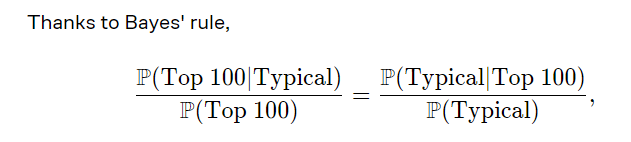

- We can estimate the probability of a song is within the typical range given that is in Top 100 [P(Typical | Top 100)] from the Spotify Data

### Then, I am going to use CDF of Danceability of All Songs to find P(Typical), the probability a Spotify song has a danceability between 52 to 75

In [41]:
all_songs_danceability = df['danceability_%']
pmf_all_songs_danceability = all_songs_danceability.value_counts(normalize=True).sort_index()
cdf_all_songs_danceability = pmf_all_songs_danceability.cumsum()

In [42]:
fig_cdf = go.Figure()
fig_cdf.add_trace(go.Scatter(x=cdf_all_songs_danceability.index, y=cdf_all_songs_danceability.values, name='All Songs',
                             line=dict(color='magenta', width=2, dash='dash'), hoverinfo='x+y', hoverlabel=dict(bgcolor="magenta")))

# Retrieve CDF values for danceability at 52 and 75
cdf_52 = cdf_all_songs_danceability.loc[52]
cdf_75 = cdf_all_songs_danceability.loc[75]

# Update layout with annotations and shapes
fig_cdf.update_layout(
    title='Cumulative Distribution Function (CDF) of All Song Danceability',
    xaxis_title='Danceability',
    yaxis_title='Probability',
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    hovermode="x unified",
    annotations=[
        dict(x=52, y=cdf_52, xref="x", yref="y", text=f"CDF(52) = {cdf_52:.2f}", showarrow=True, arrowhead=2, ax=40, ay=-40),
        dict(x=75, y=cdf_75, xref="x", yref="y", text=f"CDF(75) = {cdf_75:.2f}", showarrow=True, arrowhead=2, ax=-40, ay=-40)
    ],
    shapes=[
        dict(
            type="line",
            x0=52, x1=52, y0=0, y1=cdf_52,
            line=dict(dash="dot", color="blue", width=1),
            xref='x', yref='y'
        ),
        dict(
            type="line",
            x0=75, x1=75, y0=0, y1=cdf_75,
            line=dict(dash="dot", color="red", width=1),
            xref='x', yref='y'
        )
    ],
    template='seaborn'
)

- From the above CDF Plot, we can see that 68% of songs have danceability below 75, and 17% have danceability score below 52
- Hence, the probability of a spotify song have danceability between 52 to 75 (typical) is:

In [43]:
p_typical_danceability = 0.68 - 0.17
print(f"P(Typical) = P(0.55 ≤ danceability ≤ 0.75) = {p_typical_danceability}")

P(Typical) = P(0.55 ≤ danceability ≤ 0.75) = 0.51


50% of Top 100 songs have typical danceability, 
- So,  P(Typical∣Top 100) = 0.50
- Now, we can count this:

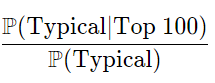

- i'll just save the probability in variable px:

In [44]:
px = 0.5/0.51
print(f"P(Typical | Top 100) / P(Typical) = {px}")

P(Typical | Top 100) / P(Typical) = 0.9803921568627451


- Since, the ratio < 1, making a song as danceable as the top 100 doesn't really help it to reach top 100.
- If you find that P(100 | Typical Danceability) is not greater than P(100), it indicates that **having typical danceability score is not a distinguishing factor** for a song to break into the Top 100. This can happen for several reasons:
- The typical energy level **might not be a significant characteristic** that influences whether a song becomes popular or not. Other features such as danceability, valence, or tempo might play a more critical role.
- The distribution of energy levels in the Top 100 songs could be similar to the distribution in the overall dataset. This means that having a typical energy level doesn't provide any additional information about a song's likelihood of being in the Top 100.


### Next, I am going to use CDF of Valence of All Songs to find P(Typical), the probability a Spotify song has a valence between 37.5 to 67

In [45]:
q25_valence= top_100_most_streamed['valence_%'].quantile(0.25)
q75_valence= top_100_most_streamed['valence_%'].quantile(0.75)

print(f"Typical Top 100 valence scores: {q25_valence} to {q75_valence}")

Typical Top 100 valence scores: 37.5 to 67.0


In [46]:
all_songs_valence = df['valence_%']
pmf_all_songs_valence = all_songs_valence.value_counts(normalize=True).sort_index()
cdf_all_songs_valence = pmf_all_songs_valence.cumsum()

fig_cdf = go.Figure()
fig_cdf.add_trace(go.Scatter(x=cdf_all_songs_valence.index, y=cdf_all_songs_valence.values, name='All Songs',
                             line=dict(color='magenta', width=2, dash='dash'), hoverinfo='x+y', hoverlabel=dict(bgcolor="magenta")))

# Update layout with annotations and shapes
fig_cdf.update_layout(
    title='Cumulative Distribution Function (CDF) of All Song Valence',
    xaxis_title='Valence',
    yaxis_title='Probability',
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    hovermode="x unified",
    template='seaborn'
)

In [47]:
p_typical_valence = 0.72 - 0.31
print(f"P(Typical) = P(37.5 ≤ valence ≤ 67) = {p_typical_valence}")

P(Typical) = P(37.5 ≤ valence ≤ 67) = 0.41


In [48]:
px2 = 0.5/p_typical_valence
print(f"P(Typical | Top 100) / P(Typical) = {px2}")

P(Typical | Top 100) / P(Typical) = 1.2195121951219512


- Since, the ratio > 1, making a song to have similiar valence range as the top 100 could help it to reach top 100.

### With the same way of the above, I measure other features and find out if any of them could give bigger boost

In [49]:
# define a function for ploting the CDF of the features
def plot_cdf(df, feature, title):
    feature_data = df[feature]
    pmf_feature = feature_data.value_counts(normalize=True).sort_index()
    cdf_feature = pmf_feature.cumsum()

    fig_cdf = go.Figure()
    fig_cdf.add_trace(go.Scatter(
        x=cdf_feature.index, 
        y=cdf_feature.values, 
        name='All Songs',
        line=dict(color='magenta', width=2, dash='dash'), 
        hoverinfo='x+y', 
        hoverlabel=dict(bgcolor="magenta")
    ))
    fig_cdf.update_layout(
        title=f'Cumulative Distribution Function (CDF) of {title}',
        xaxis_title=title,
        yaxis_title='Probability',
        legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
        hovermode="x unified",
        template = 'seaborn')
    fig_cdf.show()

###  1. Speechiness

In [50]:
plot_cdf(df, 'speechiness_%', 'All Song Speechiness')

In [51]:
q25_speech= top_100_most_streamed['speechiness_%'].quantile(0.25)
q75_speech= top_100_most_streamed['speechiness_%'].quantile(0.75)

print(f"Typical Top 100 speechiness scores: {q25_speech} to {q75_speech}")

Typical Top 100 speechiness scores: 4.0 to 8.0


In [52]:
p_typical_speechiness = round ((0.67 - 0.35),2)
print(f"P(Typical) = P(0.04 ≤ speechiness ≤ 0.08) = {p_typical_speechiness}")

P(Typical) = P(0.04 ≤ speechiness ≤ 0.08) = 0.32


In [53]:
px3 = 0.5/p_typical_speechiness
print(f"P(Typical | Top 100) / P(Typical) = {px3}")

P(Typical | Top 100) / P(Typical) = 1.5625


###  2. Energy

In [54]:
plot_cdf(df, 'energy_%', 'All Song Energy')

In [55]:
q25_energy= top_100_most_streamed['energy_%'].quantile(0.25)
q75_energy= top_100_most_streamed['energy_%'].quantile(0.75)

print(f"Typical Top 100 energy scores: {q25_energy} to {q75_energy}")

Typical Top 100 energy scores: 52.0 to 78.0


In [56]:
p_typical_energy = 0.78 - 0.23
print(f"P(Typical) = P(0.52 ≤ energy ≤ 0.78) = {p_typical_energy}")

P(Typical) = P(0.52 ≤ energy ≤ 0.78) = 0.55


In [57]:
px4 = 0.5/p_typical_energy
print(f"P(Typical | Top 100) / P(Typical) = {px4}")

P(Typical | Top 100) / P(Typical) = 0.9090909090909091


###  3. Acousticness

In [58]:
plot_cdf(df, 'acousticness_%', 'All Song Acousticness')

In [59]:
q25_acoustic= top_100_most_streamed['acousticness_%'].quantile(0.25)
q75_acoustic= top_100_most_streamed['acousticness_%'].quantile(0.75)

print(f"Typical Top 100 Acousticness scores: {q25_acoustic} to {q75_acoustic}")

Typical Top 100 Acousticness scores: 3.0 to 44.75


In [60]:
p_typical_acoustic = round ((0.79 - 0.18), 2)
print(f"P(Typical) = P(3 ≤ Acousticness ≤ 44.75) = {p_typical_acoustic}")

P(Typical) = P(3 ≤ Acousticness ≤ 44.75) = 0.61


In [61]:
px6 = round ((0.5/p_typical_acoustic),2)
print(f"P(Typical | Top 100) / P(Typical) = {px6}")

P(Typical | Top 100) / P(Typical) = 0.82


###  4. Tempo (BPM)

In [62]:
plot_cdf(df, 'bpm', 'All Song BPM')

In [63]:
q25_bpm= top_100_most_streamed['bpm'].quantile(0.25)
q75_bpm= top_100_most_streamed['bpm'].quantile(0.75)

print(f"Typical Top 100 BPM scores: {q25_bpm} to {q75_bpm}")

Typical Top 100 BPM scores: 101.5 to 141.25


In [64]:
p_typical_bpm = round ((0.77 - 0.29), 2)
print(f"P(Typical) = P(101.5 ≤ bpm ≤ 141.25) = {p_typical_bpm}")

P(Typical) = P(101.5 ≤ bpm ≤ 141.25) = 0.48


In [65]:
px7 = round ((0.5/p_typical_bpm),2)
print(f"P(Typical | Top 100) / P(Typical) = {px7}")

P(Typical | Top 100) / P(Typical) = 1.04


### Combining Features

Explore combinations of features to gain more insights into what makes a song likely to enter the Top 100

- Top 100 songs typically have danceability between 55 and 75; 
- and energy between 52 and 78
- Below is the data I filtered to find all songs within these ranges

In [66]:
q25_dance = df['danceability_%'].quantile(0.25)
q75_dance = df['danceability_%'].quantile(0.75)
q25_energy = df['energy_%'].quantile(0.25)
q75_energy = df['energy_%'].quantile(0.75)


df_dance_energy = df[(df['danceability_%'] >=q25_dance) & (df['danceability_%'] <= q75_dance) &
                 (df['energy_%'] >= q25_energy) & (df['energy_%'] <= q75_energy)]
df_dance_energy.head()

,track_name,artist(s)_name,artist_count,in_spotify_playlists,in_spotify_charts,streams,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%,released_date
1,LALA,Myke Towers,1,1474,48,1.337163e+08,92,C#,Major,71,61,74,7,0,10,4,2023-03-23
6,Ella Baila Sola,"Eslabon Armado, Peso Pluma",2,3090,50,7.259801e+08,148,F,Minor,67,83,76,48,0,8,3,2023-03-16
7,Columbia,Quevedo,1,714,43,5.814938e+07,100,F,Major,67,26,71,37,0,11,4,2023-07-07
10,un x100to,"Bad Bunny, Grupo Frontera",2,2876,40,5.056714e+08,83,F#,Minor,57,56,72,23,0,27,5,2023-04-17
12,Flowers,Miley Cyrus,1,12211,115,1.316856e+09,118,C#,Major,71,65,68,6,0,3,7,2023-01-12


In [67]:
print (f'''This data has {len(df)} songs, and {len(df_dance_energy)} of which have typical top 100 danceabiliy and energy.
This gives the joint probability:
P(Typical Danceability and Typical Energy) = {len(df_dance_energy)} / {len(df)}''')

This data has 952 songs, and 268 of which have typical top 100 danceabiliy and energy.
This gives the joint probability:
P(Typical Danceability and Typical Energy) = 268 / 952


In [68]:
p_typical_dance_energy = round (len(df_dance_energy)/len(df), 2)
print(f"P(Typical Danceability and Typical Energy) = {p_typical_dance_energy}")

P(Typical Danceability and Typical Energy) = 0.28


Now, I'll find the probability that: 
- 55 ≤ Danceability ≤ 75 and 52 ≤ Energy ≤ 78, given the song is in Top 100
- Mathematically written as P(55 ≤ Danceability ≤ 75 and 52 ≤ Energy ≤ 78 | Top 100)

In [69]:
df_dance_energy_top100 = top_100_most_streamed[(top_100_most_streamed['danceability_%'] >=q25_dance) & (top_100_most_streamed['danceability_%'] <= q75_dance) &
                 (top_100_most_streamed['energy_%'] >= q25_energy) & (top_100_most_streamed['energy_%'] <= q75_energy)]

df_dance_energy_top100.head()

,track_name,artist(s)_name,artist_count,in_spotify_playlists,in_spotify_charts,streams,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%,released_date,danceability_bin
5,One Dance,"Drake, WizKid, Kyla",3,43257,24,2.713922e+09,104,C#,Major,77,36,63,1,0,36,5,2016-04-04,"(59.5, 77.75]"
6,STAY (with Justin Bieber),"Justin Bieber, The Kid Laroi",2,17050,36,2.665344e+09,170,C#,Major,59,48,76,4,0,10,5,2021-07-09,"(41.25, 59.5]"
9,Starboy,"The Weeknd, Daft Punk",2,29536,79,2.565530e+09,186,G,Major,68,49,59,16,0,13,28,2016-09-21,"(59.5, 77.75]"
11,Heat Waves,Glass Animals,1,22543,63,2.557976e+09,81,B,Major,76,53,53,44,0,9,9,2020-06-28,"(59.5, 77.75]"
22,Something Just Like This,"The Chainsmokers, Coldplay",2,23375,21,2.204081e+09,103,B,Minor,61,47,65,3,0,17,4,2017-02-22,"(59.5, 77.75]"


In [70]:
print(f'''from this Top 100 Songs, {len(df_dance_energy_top100)} of which has the typical danceability and energy.
This gives the probability:
P(Typical Danceability and Typical Energy | Top 100) = {len(df_dance_energy_top100)} / {len(top_100_most_streamed)}''')

from this Top 100 Songs, 26 of which has the typical danceability and energy.
This gives the probability:
P(Typical Danceability and Typical Energy | Top 100) = 26 / 100


In [71]:
p_typical_dance_energy_top100 = len(df_dance_energy_top100)/len(top_100_most_streamed)
print(f"P(Typical Danceability and Typical Energy | Top 100) = {p_typical_dance_energy_top100}")

P(Typical Danceability and Typical Energy | Top 100) = 0.26


P(Typical Danceability and Typical Energy | Top 100) / P(Typical Danceability and Typical Energy)

In [72]:
p_comb = round ((p_typical_dance_energy / p_typical_dance_energy_top100), 2)
print (f'this means, combining energy with danceability gives a song {round(((p_comb-1)*100),2)}% more chance to be in Top 100')

this means, combining energy with danceability gives a song 8.0% more chance to be in Top 100


### Below, I define two functions to do the above calculations to combine other features.
- The first function used to calculate probability a song can be in top 100 by combining two features
- The second function used to calculate probability a song can be in top 100 by combining four features

In [73]:
def calculate_typical_probability(df, top_100_most_streamed, feature1, feature2):
    # Calculate the interquartile range (IQR) for the features
    q25_feature1 = top_100_most_streamed[feature1].quantile(0.25)
    q75_feature1 = top_100_most_streamed[feature1].quantile(0.75)
    q25_feature2 = top_100_most_streamed[feature2].quantile(0.25)
    q75_feature2 = top_100_most_streamed[feature2].quantile(0.75)
    
    # Filter the main dataframe based on the IQR of the top 100 most streamed dataframe
    df_filtered = df[(df[feature1] >= q25_feature1) & (df[feature1] <= q75_feature1) &
                     (df[feature2] >= q25_feature2) & (df[feature2] <= q75_feature2)]
    
    p_typical = len(df_filtered) / len(df)
    print(f"P(Typical {feature1} and Typical {feature2}) = {p_typical}")
    
    # Filter the top 100 most streamed dataframe based on the same IQR
    top100_filtered = top_100_most_streamed[(top_100_most_streamed[feature1] >= q25_feature1) & (top_100_most_streamed[feature1] <= q75_feature1) &
                                 (top_100_most_streamed[feature2] >= q25_feature2) & (top_100_most_streamed[feature2] <= q75_feature2)]
    
    p_typical_top100 = len(top100_filtered) / len(top_100_most_streamed)
    print(f"P(Typical {feature1} and Typical {feature2} | Top 100) = {p_typical_top100}")
    
    # Calculate the ratio of the two probabilities
    ratio = p_typical_top100 / p_typical
    print(f"P(Typical {feature1} and Typical {feature2} | Top 100) / P(Typical {feature1} and Typical {feature2}) = {ratio}")
    
    return p_typical, p_typical_top100, ratio

In [74]:
def calculate_typical_probability_4features(df, top_100_most_streamed, feature1, feature2, feature3, feature4):
    # Calculate the interquartile range (IQR) for each feature
    q25_feature1 = top_100_most_streamed[feature1].quantile(0.25)
    q75_feature1 = top_100_most_streamed[feature1].quantile(0.75)
    q25_feature2 = top_100_most_streamed[feature2].quantile(0.25)
    q75_feature2 = top_100_most_streamed[feature2].quantile(0.75)
    q25_feature3 = top_100_most_streamed[feature3].quantile(0.25)
    q75_feature3 = top_100_most_streamed[feature3].quantile(0.75)
    q25_feature4 = top_100_most_streamed[feature4].quantile(0.25)
    q75_feature4 = top_100_most_streamed[feature4].quantile(0.75)
    
    # Filter the main dataframe based on the IQR of the top 100 most streamed dataframe
    df_filtered = df[(df[feature1] >= q25_feature1) & (df[feature1] <= q75_feature1) &
                     (df[feature2] >= q25_feature2) & (df[feature2] <= q75_feature2) &
                     (df[feature3] >= q25_feature3) & (df[feature3] <= q75_feature3) &
                     (df[feature4] >= q25_feature4) & (df[feature4] <= q75_feature4)]
    
    p_typical = len(df_filtered) / len(df)
    print(f"P(Typical {feature1}, {feature2}, {feature3}, and {feature4}) = {p_typical}")
    
    # Filter the top 100 most streamed dataframe based on the same IQR
    top100_filtered = top_100_most_streamed[(top_100_most_streamed[feature1] >= q25_feature1) & (top_100_most_streamed[feature1] <= q75_feature1) &
                                            (top_100_most_streamed[feature2] >= q25_feature2) & (top_100_most_streamed[feature2] <= q75_feature2) &
                                            (top_100_most_streamed[feature3] >= q25_feature3) & (top_100_most_streamed[feature3] <= q75_feature3) &
                                            (top_100_most_streamed[feature4] >= q25_feature4) & (top_100_most_streamed[feature4] <= q75_feature4)]
    
    p_typical_top100 = len(top100_filtered) / len(top_100_most_streamed)
    print(f"P(Typical {feature1}, {feature2}, {feature3}, and {feature4} | Top 100) = {p_typical_top100}")
    
    # Calculate the ratio of the two probabilities
    ratio = p_typical_top100 / p_typical
    print(f"P(Typical {feature1}, {feature2}, {feature3}, and {feature4} | Top 100) / P(Typical {feature1}, {feature2}, {feature3}, and {feature4}) = {ratio}")
    
    return p_typical, p_typical_top100, ratio

In [75]:
calculate_typical_probability(df, top_100_most_streamed, 'speechiness_%', 'valence_%')

P(Typical speechiness_% and Typical valence_%) = 0.21008403361344538
P(Typical speechiness_% and Typical valence_% | Top 100) = 0.29
P(Typical speechiness_% and Typical valence_% | Top 100) / P(Typical speechiness_% and Typical valence_%) = 1.3803999999999998


(0.21008403361344538, 0.29, 1.3803999999999998)

In [76]:
calculate_typical_probability(df, top_100_most_streamed, 'speechiness_%', 'liveness_%')

P(Typical speechiness_% and Typical liveness_%) = 0.29831932773109243
P(Typical speechiness_% and Typical liveness_% | Top 100) = 0.33
P(Typical speechiness_% and Typical liveness_% | Top 100) / P(Typical speechiness_% and Typical liveness_%) = 1.1061971830985917


(0.29831932773109243, 0.33, 1.1061971830985917)

In [77]:
calculate_typical_probability_4features(df, top_100_most_streamed, 'speechiness_%', 'valence_%', 'danceability_%', 'bpm')

P(Typical speechiness_%, valence_%, danceability_%, and bpm) = 0.05357142857142857
P(Typical speechiness_%, valence_%, danceability_%, and bpm | Top 100) = 0.13
P(Typical speechiness_%, valence_%, danceability_%, and bpm | Top 100) / P(Typical speechiness_%, valence_%, danceability_%, and bpm) = 2.4266666666666667


(0.05357142857142857, 0.13, 2.4266666666666667)

### You see, having typical speechiness, valence, danceability, and tempo as the top 100, can gives 142% more chance for a song to be in top 100